# Polyp Detection using YOLOv8 on Kvasir-SEG Dataset

## 0. Environment Setup

In [ ]:
!pip install -q ultralytics

In [ ]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
from PIL import Image
import shutil
import os
from sklearn.model_selection import train_test_split
import torch
from ultralytics import YOLO

## 1. Dataset Download and Path Setup

### 1.1 Download Kvasir-SEG Dataset

In [ ]:
import kagglehub
dataset_path = kagglehub.dataset_download('debeshjha1/kvasirseg')
dataset_path = Path(dataset_path)

### 1.2 Define Image and Annotation Paths

In [ ]:
image_dir = dataset_path / "Kvasir-SEG/Kvasir-SEG/images"
annotated_image_dir = dataset_path / "Kvasir-SEG/Kvasir-SEG/annotated_images"
bbox_dir = dataset_path / "Kvasir-SEG/Kvasir-SEG/bbox"

## 2. Load and Merge Bounding Box CSVs

### 2.1 Read CSV Files and Add Image Names

In [ ]:
bbox_csv_files = list(bbox_dir.glob("*.csv"))

In [ ]:
df_list = []

for csv in bbox_csv_files:
  df = pd.read_csv(csv)
  # Extract image name from the csv file name
  image_name = csv.stem
  df["image"] = image_name
  df_list.append(df)

bbox_df = pd.concat(df_list, ignore_index=True)
bbox_df.head()

,class_name,xmin,ymin,xmax,ymax,image
0,polyp,52,116,258,341,cjyzu9th0qt4r0a46pyl4zik0
1,polyp,204,130,367,310,cju34zivp3fq80988opxbaqyn
2,polyp,56,108,482,466,cju8432cmkgq90871cxe4iptl
3,polyp,220,129,402,348,cju5wi6bqlxy90755bu227nvb
4,polyp,299,43,616,480,cju32zhbnc1oy0801iyv1ix6p


### 2.2 Add Image and Annotated Image Paths

In [ ]:
bbox_df['image_path'] = bbox_df['image'].apply(lambda x: image_dir / f"{x}.jpg")
bbox_df['annotated_image_path'] = bbox_df['image'].apply(lambda x: annotated_image_dir / f"{x}.jpg")

### 2.3 Visualize

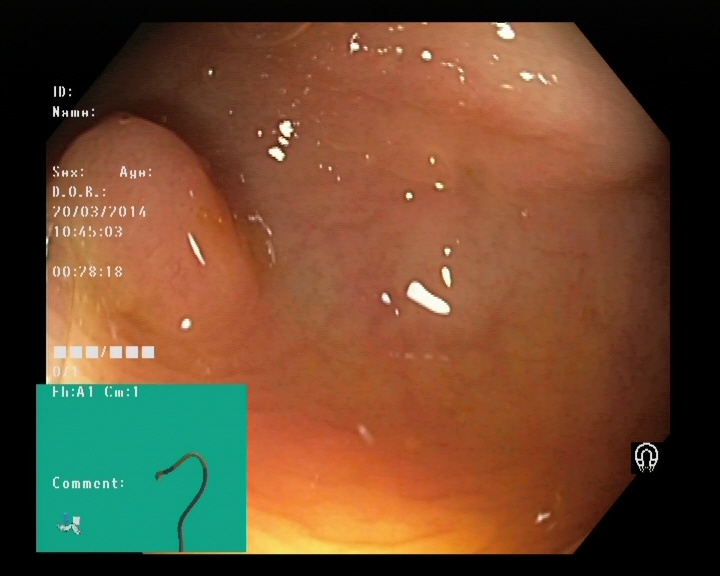

In [ ]:
img = Image.open(bbox_df['image_path'][0])
img

In [ ]:
width, height = img.size
width, height

(720, 576)

## 3. Bounding Box Calculations

### 3.1 Get Image Dimensions

In [ ]:
def get_image_size(image_path):
  try:
    with Image.open(image_path) as img:
      return img.width, img.height
  except:
    return None, None

In [ ]:
# Image width and height
bbox_df['image_width'], bbox_df['image_height'] = zip(*bbox_df['image_path'].apply(get_image_size))

### 3.2 Calculate Bounding Box Dimensions and Centers

In [ ]:
# Bounding box width and height
bbox_df['bbox_width'] = bbox_df['xmax'] - bbox_df['xmin']
bbox_df['bbox_height'] = bbox_df['ymax'] - bbox_df['ymin']

# Bounding box center (in pixel coordinates)
bbox_df['x_center'] = bbox_df['xmin'] + bbox_df['bbox_width'] / 2
bbox_df['y_center'] = bbox_df['ymin'] + bbox_df['bbox_height'] / 2

### 3.3 Normalize Bounding Boxes for YOLO Format

In [ ]:
# Normalize for YOLO
bbox_df['x_center_norm'] = bbox_df['x_center'] / bbox_df['image_width']
bbox_df['y_center_norm'] = bbox_df['y_center'] / bbox_df['image_height']
bbox_df['bbox_width_norm'] = bbox_df['bbox_width'] / bbox_df['image_width']
bbox_df['bbox_height_norm'] = bbox_df['bbox_height'] / bbox_df['image_height']

In [ ]:
bbox_df.head()

,class_name,xmin,ymin,xmax,ymax,image,image_path,annotated_image_path,image_width,image_height,bbox_width,bbox_height,x_center,y_center,x_center_norm,y_center_norm,bbox_width_norm,bbox_height_norm
0,polyp,52,116,258,341,cjyzu9th0qt4r0a46pyl4zik0,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,720,576,206,225,155.0,228.5,0.215278,0.396701,0.286111,0.390625
1,polyp,204,130,367,310,cju34zivp3fq80988opxbaqyn,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,580,528,163,180,285.5,220.0,0.492241,0.416667,0.281034,0.340909
2,polyp,56,108,482,466,cju8432cmkgq90871cxe4iptl,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,626,546,426,358,269.0,287.0,0.429712,0.525641,0.680511,0.655678
3,polyp,220,129,402,348,cju5wi6bqlxy90755bu227nvb,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,622,530,182,219,311.0,238.5,0.500000,0.450000,0.292605,0.413208
4,polyp,299,43,616,480,cju32zhbnc1oy0801iyv1ix6p,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/...,622,531,317,437,457.5,261.5,0.735531,0.492467,0.509646,0.822976


## 4. Prepare YOLO Dataset Directory

### 4.1 Create Train/Val Directory Structure

In [ ]:
yolo_dataset = Path('dataset')
for split in ["train" , "val"]:
  (yolo_dataset / "images"/ split).mkdir(parents=True, exist_ok=True)
  (yolo_dataset / "labels" / split).mkdir(parents=True, exist_ok=True)

### 4.2 Train/Val Split

In [ ]:
unique_imgs = bbox_df['image'].unique()
train_imgs, val_imgs = train_test_split(unique_imgs, test_size=0.2, random_state=42)

### 4.3 Save YOLO Formatted Label Files

In [ ]:
for img_name, group in bbox_df.groupby("image"):
  label_lines = []

  for _, row in group.iterrows():
    # YOLO format: class_id x_center y_center width height (all normalized)
    line = f"0 {row['x_center_norm']} {row['y_center_norm']} {row['bbox_width_norm']} {row['bbox_height_norm']}"
    label_lines.append(line)

  # Decide if image is train or val
  split = "train" if img_name in train_imgs else "val"

  # Save to .txt
  label_file = yolo_dataset / "labels" / split / f"{img_name}.txt"
  with open(label_file, "w") as f:
    f.write("\n".join(label_lines))

### 4.4 Copy Images to Corresponding Directories

In [ ]:
for img_name in train_imgs:
  src = image_dir / f"{img_name}.jpg"
  dest = yolo_dataset / "images" / "train" / f"{img_name}.jpg"
  shutil.copy(src, dest)

for img_name in val_imgs:
  src = image_dir / f"{img_name}.jpg"
  dest = yolo_dataset / "images" / "val" / f"{img_name}.jpg"
  shutil.copy(src, dest)

In [ ]:
print(f"Train images: {len(list((yolo_dataset / 'images/train').glob('*.jpg')))}")
print(f"Val images: {len(list((yolo_dataset / 'images/val').glob('*.jpg')))}")

Train images: 800
Val images: 200


## 5. YAML Configuration for Training

In [ ]:
dataset_yaml = """
path: /kaggle/working/dataset
train: images/train
val: images/val

nc: 1
names: ['polyp']
"""

with open("polyp.yaml", "w") as f:
  f.write(dataset_yaml)

## 6. Model Training

### 6.1 Device Configuration

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

### 6.2 Train YOLO Model

In [ ]:
 model = YOLO("yolov8m.pt")
 results = model.train(
     data="polyp.yaml",
     epochs=200,
     patience=30,
     imgsz=640,
     batch=16,
     device=device,
     degrees=10,
     translate=0.1,
     scale=0.2,
     flipud=0.0,
     fliplr=0.5,
     hsv_h=0.01,
     hsv_s=0.5,
     hsv_v=0.3
    )

Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=polyp.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.5, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, 

train: Scanning /kaggle/working/dataset/labels/train.cache... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 809.7±502.0 MB/s, size: 60.0 KB)


val: Scanning /kaggle/working/dataset/labels/val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      6.08G      1.457      2.076      1.838         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        200        204      0.127      0.451     0.0973     0.0335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      6.36G      1.613      2.019      1.925         29        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]

                   all        200        204    0.00292     0.0147    0.00149   0.000398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      6.36G      1.682       2.04      1.958         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204     0.0184     0.0833    0.00598    0.00114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      6.35G      1.602      1.927      1.887         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        200        204      0.184       0.23      0.138     0.0472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      6.36G      1.576      1.884      1.864         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.504      0.417      0.409      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      6.35G      1.522       1.81      1.816         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.506      0.525      0.474      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      6.35G      1.479      1.716      1.793         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.508      0.618      0.573      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      6.34G      1.415      1.594      1.739         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.717      0.623      0.711        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      6.36G      1.409      1.619      1.743         27        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        200        204      0.552      0.632      0.561      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      6.36G      1.395      1.613      1.718         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.474      0.402      0.371      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      6.36G      1.342      1.516      1.678         26        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.688      0.736      0.769       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      6.35G      1.329      1.504      1.639         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.709       0.76      0.804      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      6.34G      1.303      1.457      1.643         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        200        204      0.703       0.73      0.767      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      6.34G      1.313      1.383      1.652         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        200        204      0.781      0.676      0.784      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      6.37G      1.291      1.403       1.62         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        200        204      0.733      0.711      0.773      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      6.35G      1.251      1.361      1.612         27        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.774       0.79      0.838      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      6.35G      1.281      1.346      1.612         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.771       0.77      0.829      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      6.35G      1.315      1.406      1.645         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.772      0.795      0.848      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      6.34G      1.221      1.227       1.58         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.811      0.794      0.861       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      6.35G      1.236      1.294      1.578         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.754      0.706      0.774      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      6.33G       1.22      1.264      1.565         24        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.713       0.83        0.8      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      6.35G      1.232      1.204      1.584         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.818      0.765      0.836      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      6.35G      1.219      1.212      1.551         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.819      0.799      0.863      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      6.34G      1.208      1.225      1.558         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.818      0.765      0.831       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      6.35G      1.207      1.203      1.558         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.818       0.77      0.836      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      6.35G      1.219      1.168      1.558         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.815      0.758      0.819      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      6.34G      1.178      1.157       1.53         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        200        204      0.818      0.817      0.869      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      6.35G      1.181      1.185      1.533         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.813      0.833      0.872      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      6.35G      1.177      1.164      1.536         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204       0.87      0.789      0.864      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      6.35G      1.168      1.142      1.525         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        200        204      0.775      0.775      0.821      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      6.35G      1.181      1.124      1.535         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]

                   all        200        204      0.856      0.759      0.872       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      6.35G      1.156       1.11      1.523         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        200        204      0.842      0.783      0.881      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      6.34G      1.155      1.126      1.521         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.836      0.775      0.861      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      6.34G      1.165      1.117      1.539         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204       0.81      0.824      0.882      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      6.38G      1.119      1.072      1.495         26        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        200        204      0.855      0.853      0.897      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      6.33G      1.139       1.07      1.513         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.869       0.78      0.885      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      6.34G       1.15      1.104      1.509         43        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.861      0.828      0.885      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      6.34G      1.126      1.103      1.483         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204        0.8      0.809      0.834      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      6.35G       1.14      1.065      1.509         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.824      0.805       0.87       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      6.35G      1.118       1.07      1.477         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.851      0.814      0.873      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      6.35G      1.122      1.058       1.49         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.853      0.796      0.871      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      6.34G      1.113      1.015      1.478         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.779       0.75      0.796      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      6.33G      1.133      1.041      1.512         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.826      0.815      0.879      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      6.34G       1.13       1.09      1.484         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        200        204      0.795      0.876      0.878      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      6.33G      1.115      1.015      1.467         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.854      0.803      0.865      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      6.34G      1.104     0.9658       1.49         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.888      0.799      0.891      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      6.33G      1.129      1.013      1.508         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.754      0.789      0.841      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      6.34G      1.094     0.9992      1.469         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204       0.77      0.858      0.869       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      6.33G      1.088     0.9899      1.467         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.855       0.81      0.881      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      6.33G      1.076     0.9734      1.463         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.848      0.851      0.898      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      6.33G      1.096     0.9878      1.465         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.886      0.838      0.909      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      6.34G      1.069     0.9283      1.447         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        200        204      0.873      0.799      0.891      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      6.35G      1.081     0.9721      1.449         40        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.854      0.864      0.909      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      6.34G      1.043     0.9362       1.42         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.867      0.861      0.916      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      6.34G      1.038     0.9069      1.412         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.829      0.877       0.91      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      6.36G      1.083     0.9239      1.457         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.834      0.861      0.896      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      6.34G      1.073     0.9488       1.45         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.805      0.863      0.883      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      6.35G      1.054       0.96      1.421         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.848      0.843      0.893      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      6.35G      1.025     0.9032      1.414         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.853      0.814      0.911      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      6.34G      0.995     0.8592      1.381         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.866      0.858      0.892      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      6.35G      1.013     0.8625      1.403         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.796      0.863      0.895      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      6.35G      1.008     0.8768      1.385         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.836      0.877      0.891      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      6.34G      1.047      0.924      1.435         27        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204        0.9      0.853      0.917      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      6.35G      1.043     0.8949      1.418         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.836      0.804      0.882       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      6.36G      1.018     0.8647      1.403         28        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.859      0.868      0.931      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      6.36G      1.032     0.8674      1.418         43        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.847      0.824      0.897       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      6.34G      1.027     0.8849       1.41         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.889      0.838      0.917      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      6.35G      1.002     0.8823      1.392         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.877      0.868      0.914       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      6.35G     0.9959     0.8678      1.402         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.768      0.887      0.863      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      6.34G      0.986     0.8575       1.38         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.814      0.706      0.803      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      6.34G     0.9688      0.864       1.36         28        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.835      0.821       0.87      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      6.34G     0.9582     0.8152      1.365         28        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204       0.87      0.755      0.877      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      6.35G      1.006     0.8587      1.389         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.779      0.824      0.873      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      6.36G     0.9284     0.8458      1.346         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204       0.83      0.768      0.846      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      6.35G      0.946     0.8135      1.348         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.849      0.854      0.901      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      6.35G     0.9322     0.8128      1.339         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.832      0.823       0.88      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      6.34G     0.9408     0.8329      1.358         27        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.841      0.809       0.88      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      6.33G     0.9404     0.8328      1.349         27        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.822      0.794      0.875      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      6.34G     0.9217     0.7708      1.344         28        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.855      0.838      0.911      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      6.33G     0.9306     0.8207      1.353         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.895      0.784      0.897      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      6.34G      0.915     0.8236      1.345         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.821       0.83       0.88      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      6.35G     0.9055     0.7923      1.328         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.853      0.848      0.911       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      6.33G     0.9229     0.8202      1.343         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.829      0.838      0.893      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      6.33G     0.8868     0.7667      1.313         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.872      0.835      0.916      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      6.34G     0.9109      0.765      1.333         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.882      0.828      0.895      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      6.36G     0.9014     0.7633      1.327         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.872      0.819      0.901      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      6.36G      0.918     0.7909      1.329         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204       0.92      0.847      0.922      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      6.36G     0.9031     0.7682      1.311         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204       0.89      0.873      0.921      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      6.36G     0.8904     0.7876      1.312         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.874      0.858      0.927      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      6.34G     0.8922     0.7543      1.305         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.881      0.877       0.92      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      6.34G     0.9071     0.7626       1.32         28        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.888      0.853      0.906      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      6.33G      0.888     0.7625      1.317         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.823      0.822       0.87      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      6.35G     0.8617     0.7353      1.282         47        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.928      0.838      0.932       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      6.34G     0.8574     0.7235      1.283         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.854      0.858      0.911      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      6.34G     0.8604      0.724      1.287         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204       0.88      0.892      0.914      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      6.34G     0.8945     0.7569       1.33         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.829      0.881      0.912      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      6.34G     0.8942      0.735      1.324         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.906      0.848      0.918      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      6.33G     0.8544     0.7401      1.294         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.841      0.799      0.886      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      6.34G     0.8455     0.7201      1.279         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.841      0.855      0.907      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      6.32G      0.844     0.7193      1.285         43        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        200        204      0.889      0.828      0.896      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      6.33G     0.8597     0.7233      1.291         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        200        204      0.897      0.863       0.92      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      6.33G     0.8527     0.7305      1.288         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.913      0.868      0.922      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      6.34G     0.8702     0.7434      1.298         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204        0.9      0.877      0.939      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      6.34G     0.8356     0.7073      1.271         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.837      0.873       0.91      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      6.34G     0.8384     0.6892      1.281         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.896      0.848       0.91      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      6.34G     0.8213     0.6893      1.269         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.883      0.892      0.933      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      6.35G     0.8086     0.6708      1.258         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.886      0.848      0.923      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      6.34G     0.8376     0.6894      1.273         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.928      0.827      0.914      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      6.33G     0.8216     0.6804      1.268         26        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.872      0.853      0.904      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      6.34G     0.8371      0.701      1.272         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.844      0.892      0.912      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      6.34G     0.8098     0.6824      1.261         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.838      0.902      0.918        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      6.33G     0.8081     0.6599      1.263         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.902      0.902      0.942      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      6.34G     0.8354     0.7077      1.282         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.926      0.873      0.942      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      6.34G     0.8231     0.6854      1.274         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.878      0.887      0.936      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      6.34G     0.8055     0.6948      1.248         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.884      0.882      0.914      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      6.33G     0.7931     0.6778      1.249         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.856      0.874      0.919      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      6.34G     0.7773     0.6293      1.237         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.885      0.868      0.929       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      6.34G     0.7825      0.628      1.235         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.868      0.887      0.933      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      6.36G     0.7942     0.6201      1.236         26        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.919      0.837      0.922      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      6.34G     0.7686     0.6248      1.216         42        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.922      0.873      0.924      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      6.34G     0.7999     0.6435      1.252         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.907      0.863      0.923      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      6.35G     0.8038     0.6317      1.242         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.906      0.849      0.919      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      6.35G     0.8006     0.6413      1.248         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.914      0.877      0.923      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      6.35G     0.7686     0.6118      1.224         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.944      0.832      0.936      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      6.34G     0.7738     0.6297      1.224         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.863      0.925      0.942      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      6.35G     0.7714      0.601      1.224         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]

                   all        200        204      0.891      0.922      0.947       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      6.37G     0.7622     0.6177      1.222         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.889      0.926      0.939      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      6.35G      0.784     0.6253      1.234         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204       0.88      0.829      0.895      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      6.34G     0.7865     0.6143      1.247         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.868      0.905      0.921      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      6.33G     0.8036     0.6472      1.242         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.853       0.85      0.875      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      6.33G     0.7635     0.6148      1.223         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.861      0.882      0.927      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      6.34G     0.7625     0.6036      1.213         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.913      0.882      0.933      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      6.35G     0.7684     0.6235      1.232         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.866      0.902      0.928      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      6.35G     0.7192     0.5747      1.186         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.945      0.853      0.938      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      6.34G     0.7348     0.5672      1.202         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        204      0.914       0.88      0.925      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      6.35G     0.7726      0.601      1.229         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.889      0.868      0.913      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      6.34G     0.7257     0.5763      1.186         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.905      0.877      0.932      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      6.34G     0.7606     0.6072      1.217         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.878      0.853      0.928      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      6.34G     0.7347     0.5811      1.192         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.842      0.922      0.907      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      6.34G     0.7381     0.5743      1.196         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.876      0.902      0.934       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      6.35G     0.7448     0.5862      1.191         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.883      0.849      0.901      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      6.34G     0.7341     0.5791      1.188         26        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.882      0.879      0.942      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      6.34G     0.7239     0.5613      1.189         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204       0.94      0.892      0.939       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      6.34G     0.7303     0.5632      1.203         26        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.927      0.853      0.949       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      6.33G     0.7302     0.5648      1.202         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.886      0.892       0.93      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      6.34G     0.6972     0.5765       1.16         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.857      0.922      0.934      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      6.35G     0.7335     0.5734      1.196         29        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.864      0.902      0.929      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      6.35G     0.7302     0.5614      1.195         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.914      0.883      0.942      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      6.34G     0.7169     0.5611      1.183         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.897      0.912      0.951      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      6.35G     0.6936     0.5336      1.167         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.911      0.882       0.93      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      6.34G     0.7136     0.5579      1.192         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.923      0.879      0.931       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      6.35G     0.6961      0.542      1.172         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.907      0.877      0.935      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      6.35G     0.7028     0.5392      1.171         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.911      0.892      0.948      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      6.34G     0.6988     0.5209      1.166         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.886       0.88      0.932      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      6.35G     0.6937     0.5447      1.178         40        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.925      0.863      0.934      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      6.33G     0.6965     0.5462      1.175         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.901      0.846      0.921      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      6.33G     0.6953     0.5499      1.173         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.921      0.858      0.927      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      6.33G     0.7235     0.5447      1.196         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.884        0.9      0.937      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      6.33G     0.6997     0.5312      1.177         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.907      0.863      0.932      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      6.33G     0.6972     0.5462      1.164         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.933      0.858      0.938      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      6.33G     0.6668     0.4955      1.151         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.903      0.863      0.928      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      6.34G     0.6532     0.5118       1.15         27        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204       0.93       0.91      0.951      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      6.35G     0.6908     0.5415      1.179         38        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.938      0.891      0.942      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      6.35G      0.685      0.518      1.176         41        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.916      0.882      0.944       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      6.35G     0.6859     0.5306       1.16         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.899      0.912      0.947      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      6.35G     0.6605      0.506      1.147         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.916      0.863      0.935      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      6.33G     0.6722     0.5133      1.152         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.928      0.858      0.932      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      6.34G     0.6785     0.5276      1.156         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.933      0.889      0.945      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      6.34G     0.6551     0.5091      1.146         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.915      0.898      0.945      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      6.34G     0.6509     0.4865      1.146         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.941      0.838      0.938       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      6.34G     0.6794     0.4978      1.159         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204       0.92      0.868      0.936      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      6.34G     0.6713      0.513      1.154         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.923      0.885      0.942      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      6.36G     0.6761     0.5153      1.161         40        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204       0.92      0.907       0.95      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      6.35G     0.6496     0.4975       1.14         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        204      0.907      0.912       0.95      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      6.36G      0.651     0.5085      1.149         36        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.898      0.911       0.95      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      6.35G     0.6408     0.4745      1.136         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.911        0.9      0.949      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      6.35G     0.6464     0.4853      1.144         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204       0.92      0.904      0.949      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      6.34G     0.6392     0.4969       1.14         37        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.921      0.882      0.935      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      6.34G     0.6412     0.4841      1.138         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.932      0.882      0.933      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      6.34G     0.6581     0.5015      1.143         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.947      0.877      0.933      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      6.34G     0.6353     0.4823      1.127         31        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.941      0.866      0.932      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      6.34G     0.6486      0.481      1.134         34        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.917      0.882      0.934      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      6.34G     0.6226     0.4692      1.127         35        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.933      0.891      0.946      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      6.34G     0.6328     0.4792      1.129         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.934      0.877      0.936      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      6.34G     0.6391     0.4917      1.137         30        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.929      0.873      0.931      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      6.33G     0.6333     0.4839      1.131         39        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.938      0.873      0.929      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      6.33G     0.6324       0.48      1.135         42        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204      0.931      0.887      0.936       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      6.34G     0.6069     0.4628      1.117         32        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.904      0.881       0.94      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      6.34G     0.6111     0.4688      1.119         42        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.911      0.873      0.934      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      6.34G     0.6188     0.4659      1.123         33        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.908      0.873      0.936      0.743


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      6.35G     0.4241     0.2637     0.9356         16        640: 100%|██████████| 50/50 [00:26<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204      0.922      0.873      0.934       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      6.35G     0.4177     0.2487     0.9339         17        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        204      0.918      0.877       0.92      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      6.34G     0.4017     0.2448     0.9279         20        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.914      0.892      0.933      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      6.34G     0.4029     0.2378     0.9177         16        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        200        204       0.93      0.868      0.939      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      6.34G      0.396     0.2393     0.9262         17        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        200        204      0.924      0.877       0.94       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      6.35G     0.3862      0.234     0.9123         17        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.906      0.887       0.94       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      6.33G     0.3886     0.2314     0.9112         17        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        200        204      0.903      0.897      0.939      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      6.34G     0.3897     0.2296      0.917         19        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.916      0.882      0.938      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      6.34G     0.3793     0.2265     0.9046         17        640: 100%|██████████| 50/50 [00:26<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        200        204      0.923       0.88       0.94      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      6.33G     0.3868     0.2294      0.907         17        640: 100%|██████████| 50/50 [00:26<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        204       0.93      0.873      0.935      0.737



200 epochs completed in 1.676 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 52.0MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        200        204      0.933      0.877      0.936      0.761
Speed: 0.2ms preprocess, 9.4ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/train2


## 7. Evaluation Metrics

### 7.1 Precision, Recall, and mAP

In [ ]:
precision = results.box.mp
recall = results.box.mr
map50 = results.box.map50
map5095 = results.box.map

### 7.2 Display Metrics Table

In [ ]:
yolo_metrics_df = pd.DataFrame(
    {
        "Metric": ["Precision", "Recall", "mAP@0.5", "mAP@0.5:0.95"],
        "Value": [round(precision,3), round(recall,3), round(map50,3), round(map5095,3)]
    }
)

print(yolo_metrics_df)

         Metric  Value
0     Precision  0.933
1        Recall  0.877
2       mAP@0.5  0.936
3  mAP@0.5:0.95  0.761


## 8. Visualize Training Results

In [ ]:
from IPython.display import Image, display

### 8.1 Confusion Matrix

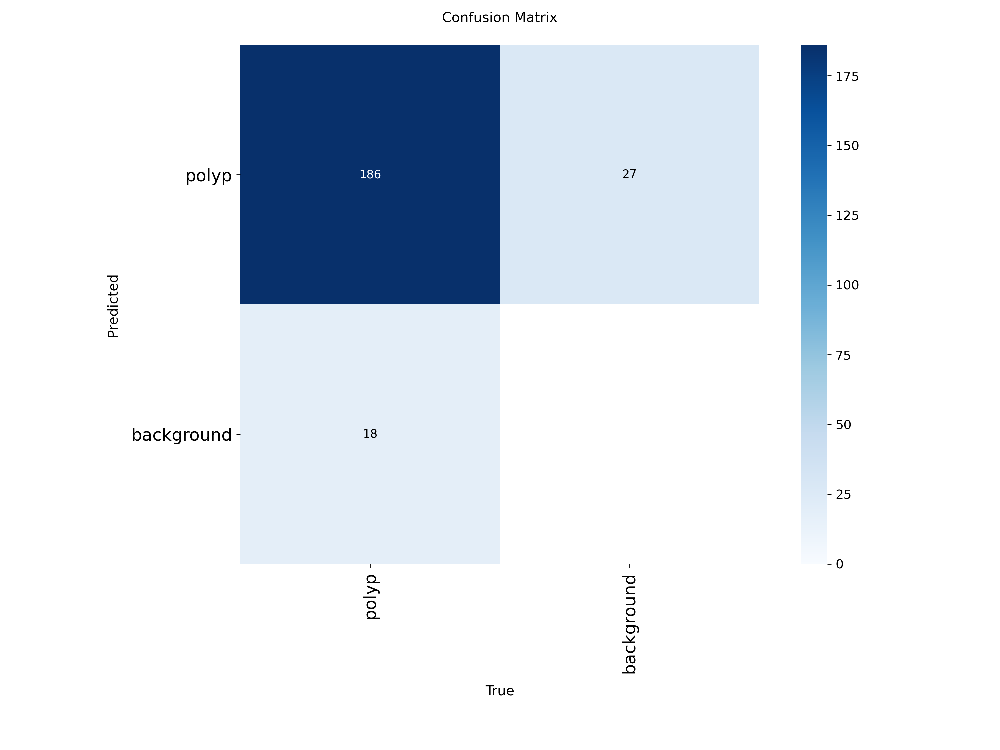

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/confusion_matrix.png'))

### 8.2 Validation Batch Ground Truth and Predictions

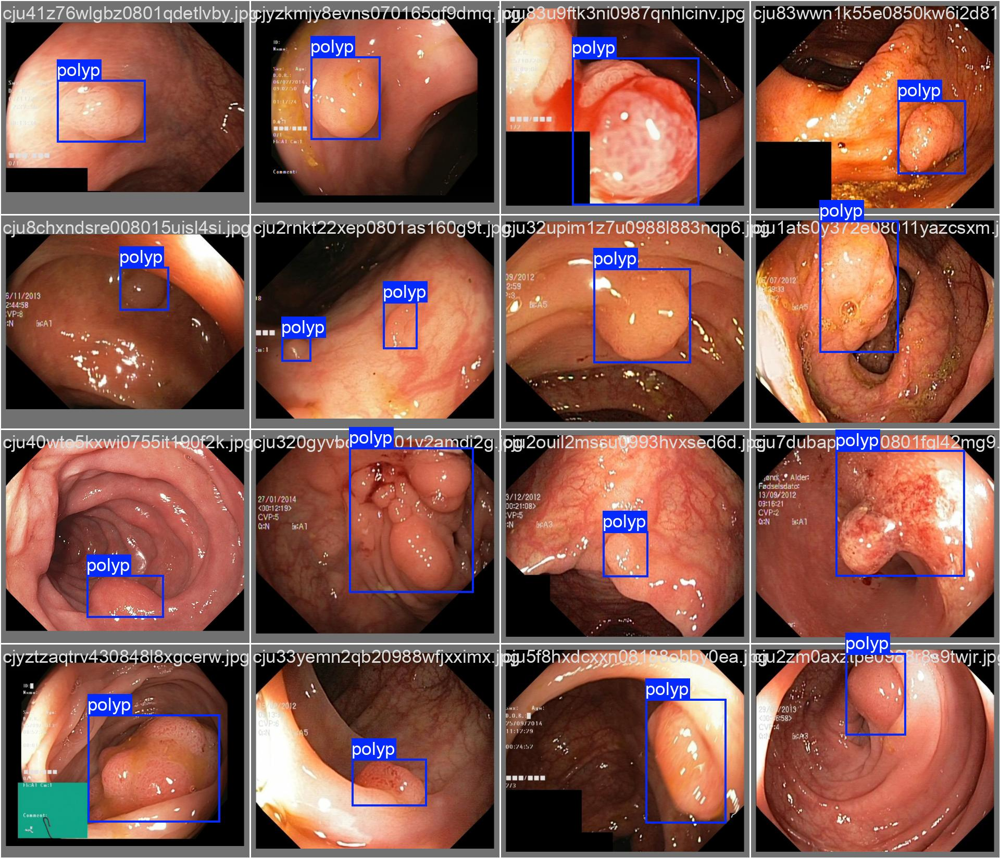

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch0_labels.jpg'))

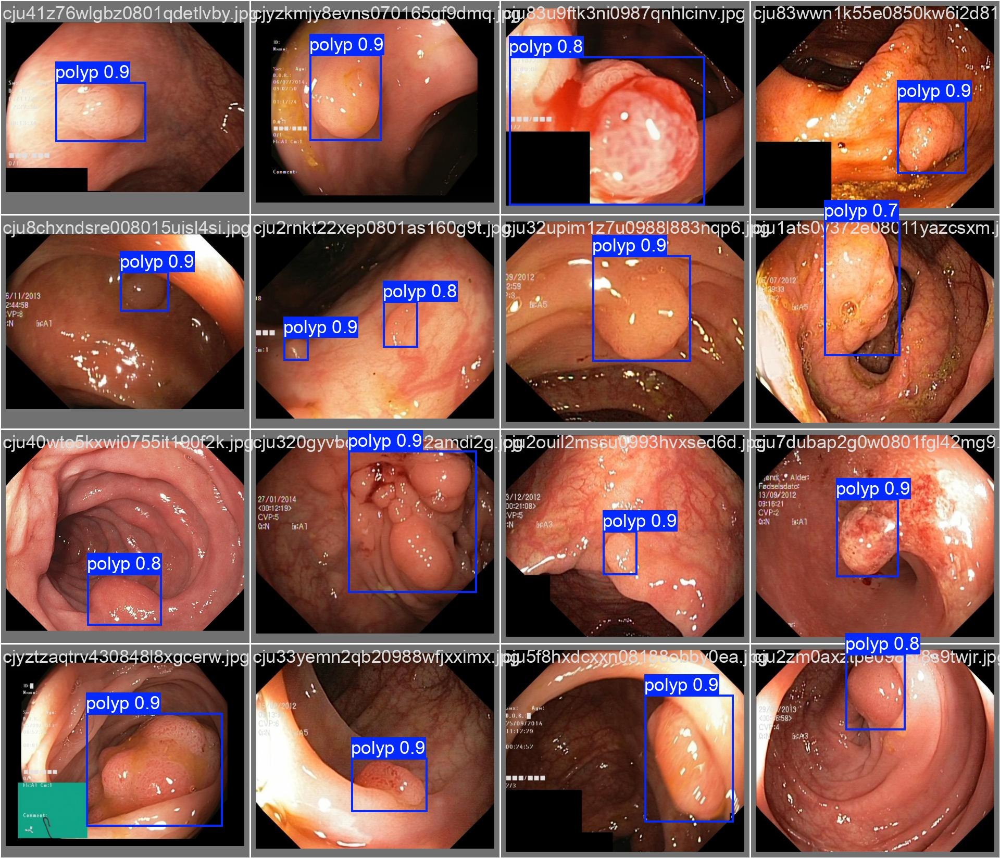

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch0_pred.jpg'))

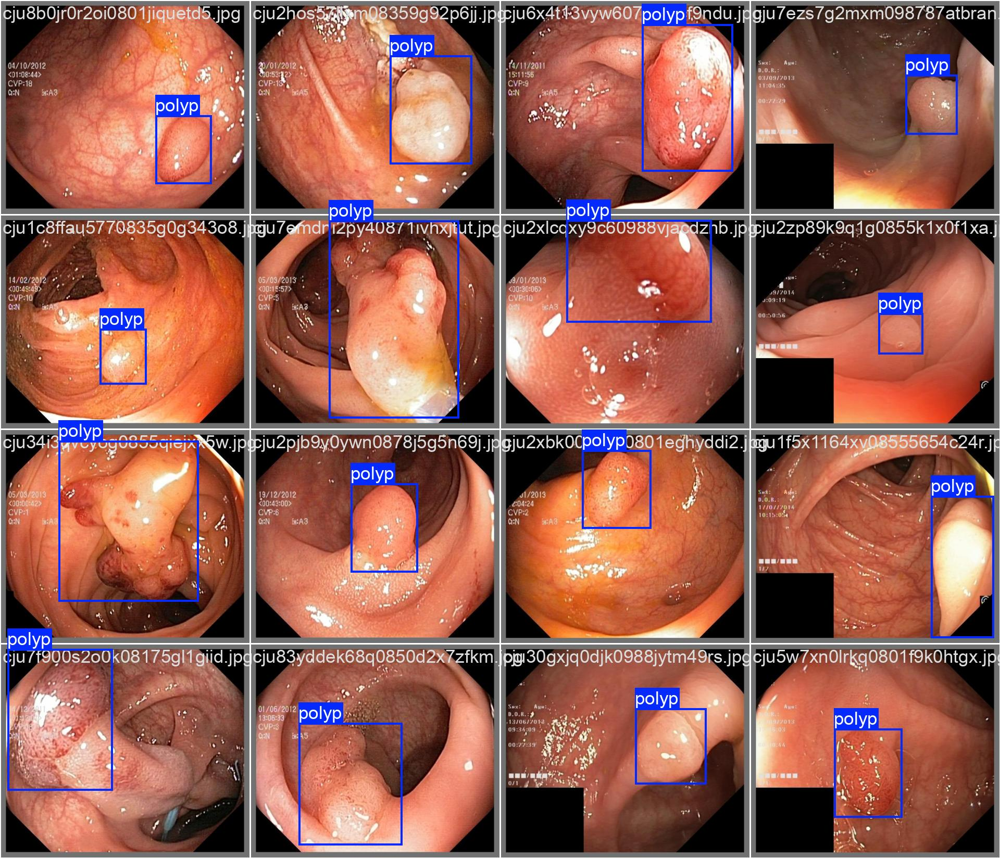

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch1_labels.jpg'))

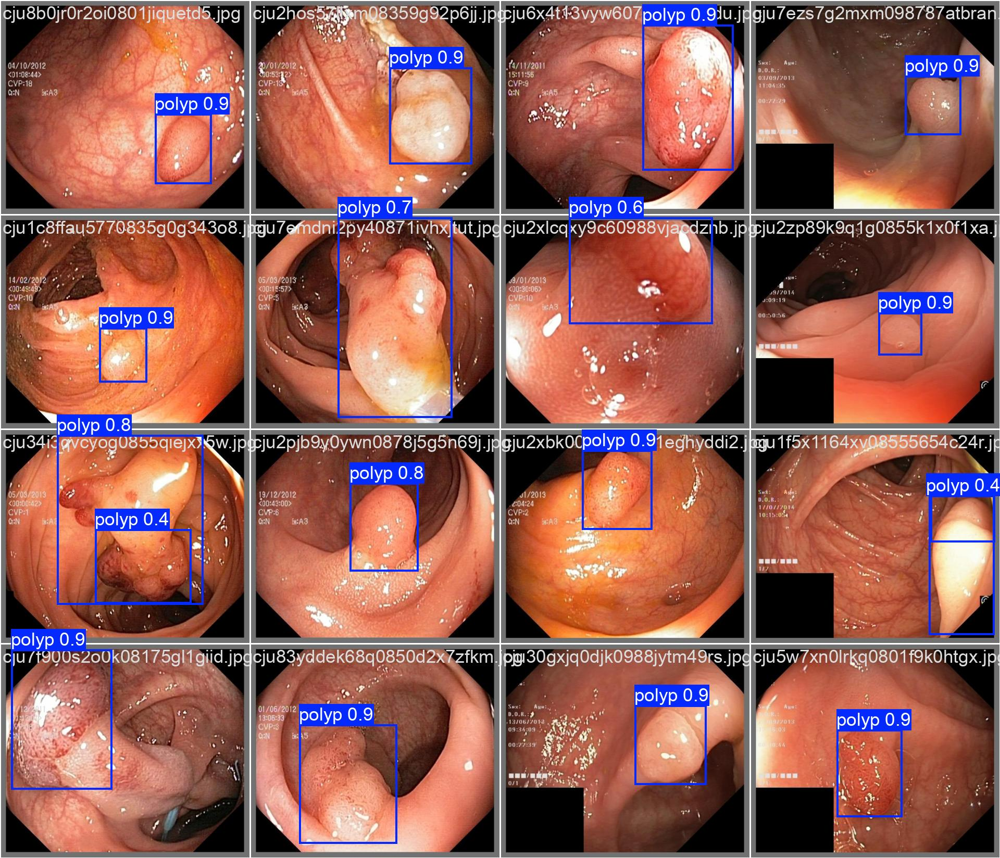

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch1_pred.jpg'))

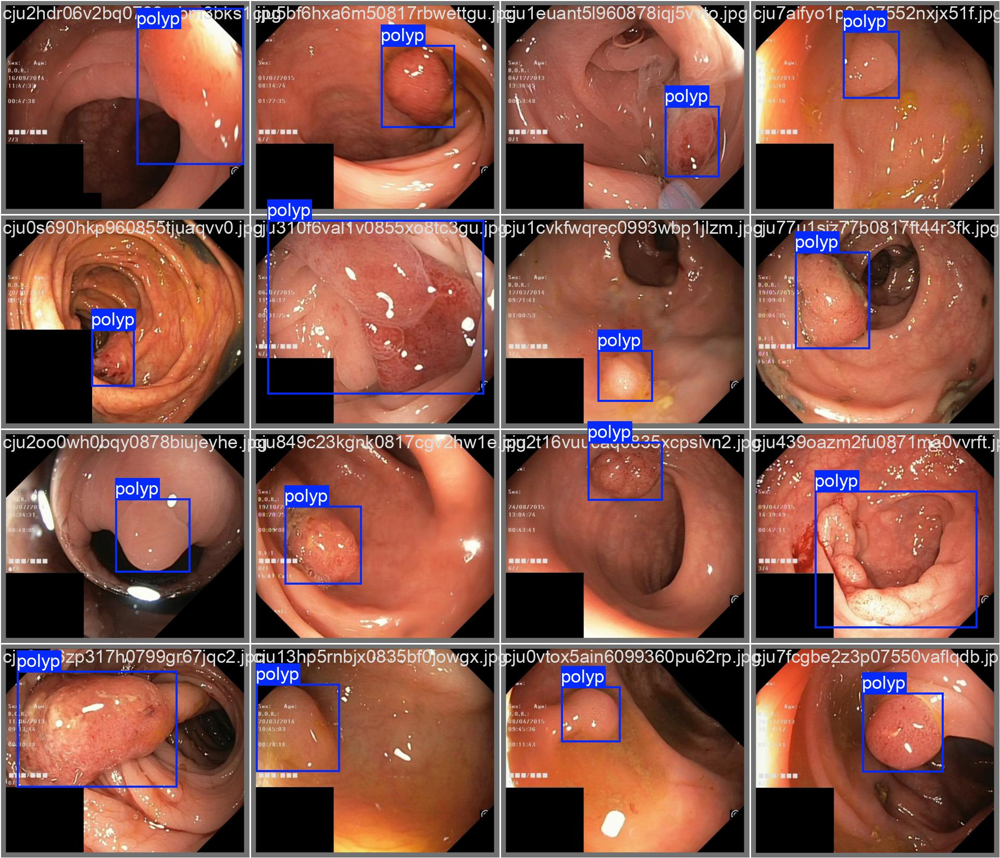

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch2_labels.jpg'))

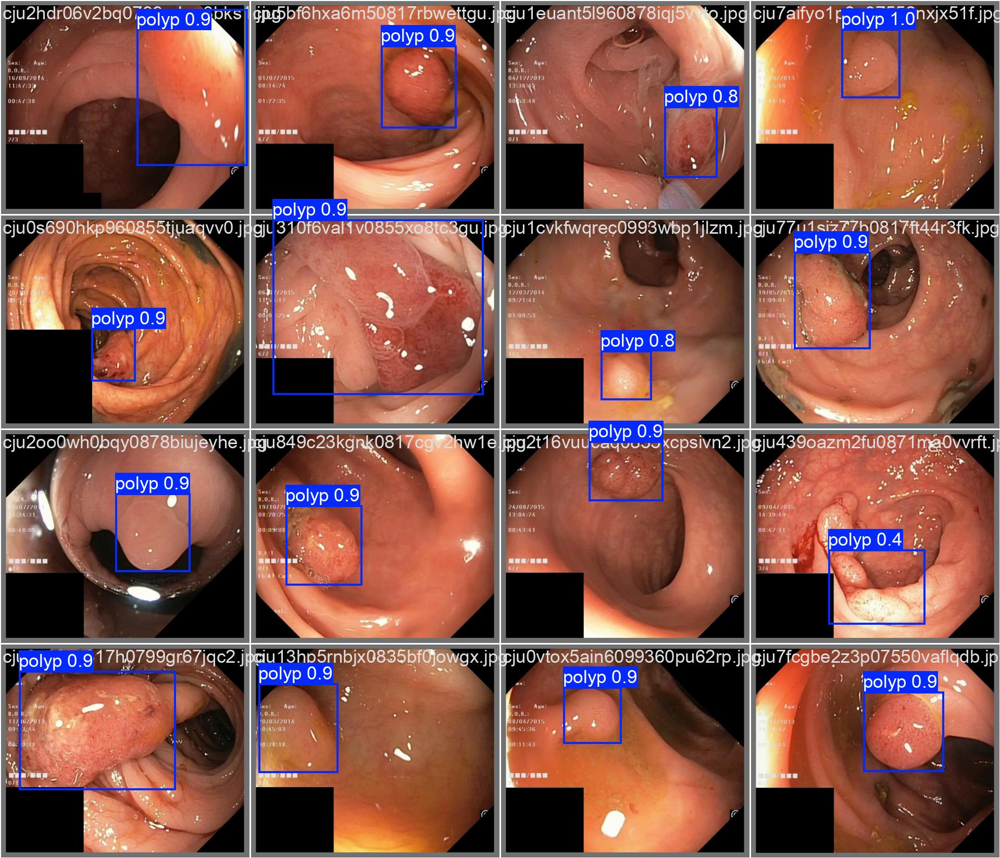

In [ ]:
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch2_pred.jpg'))

### 8.3 Training Batch Samples

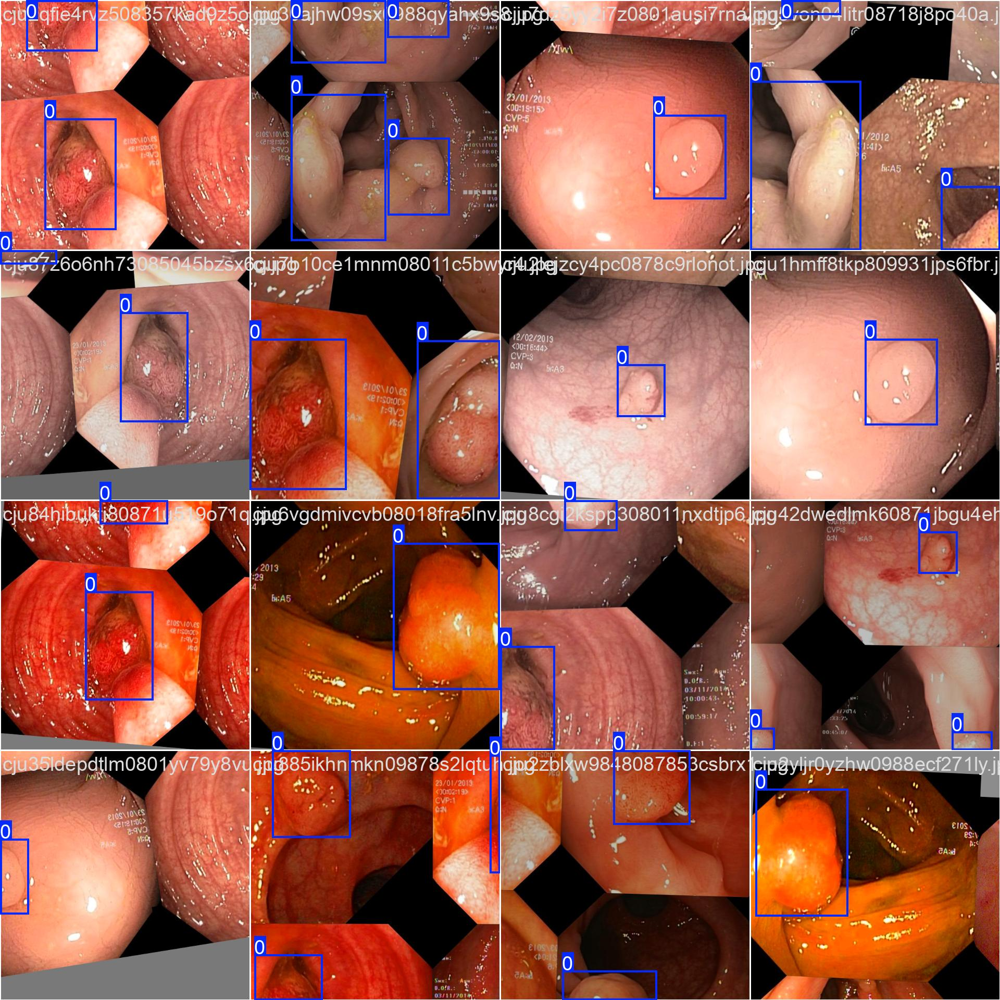

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/train_batch0.jpg'))

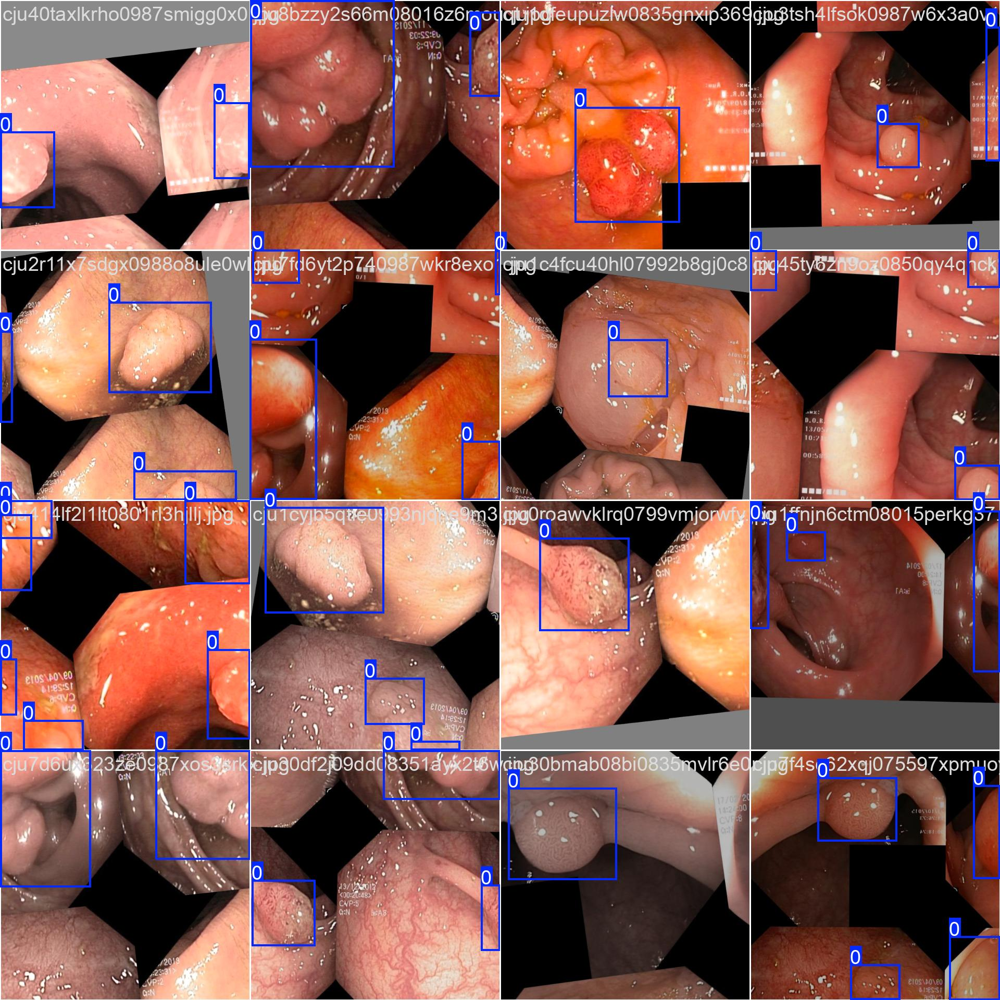

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/train_batch1.jpg'))

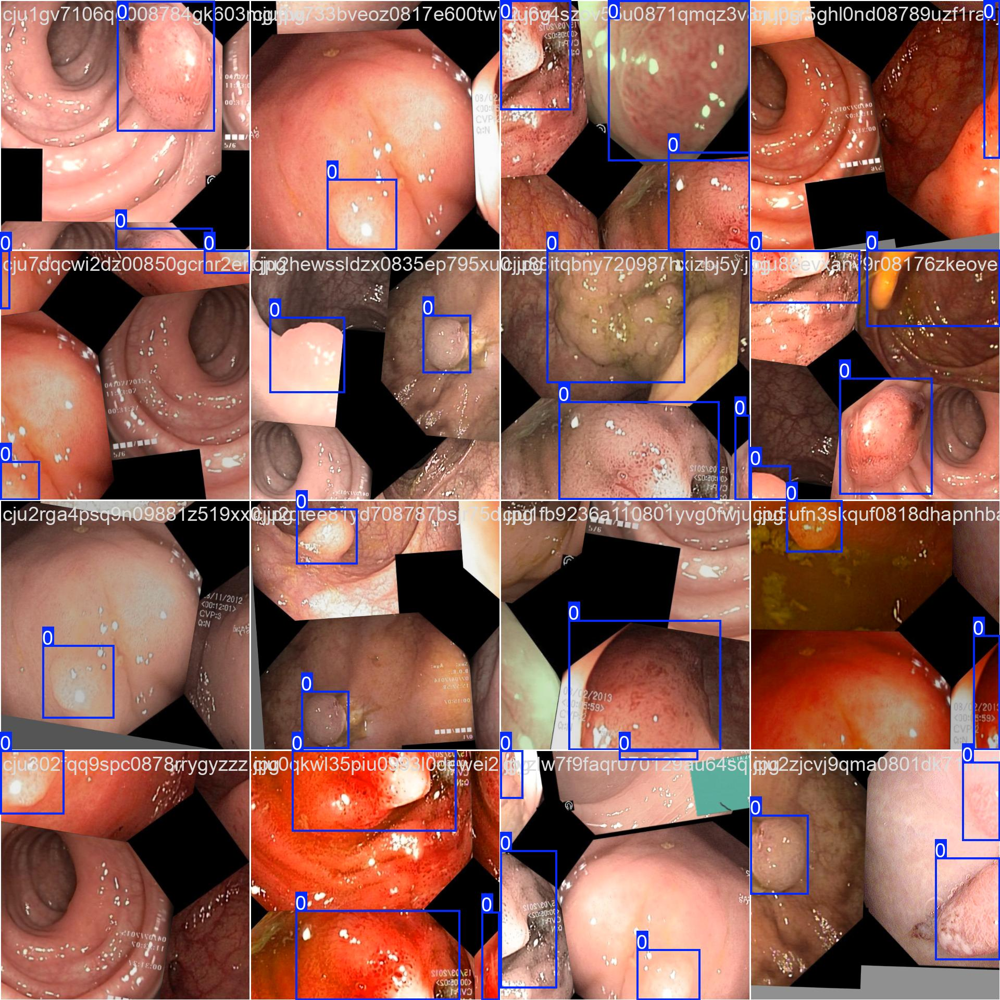

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/train_batch2.jpg'))

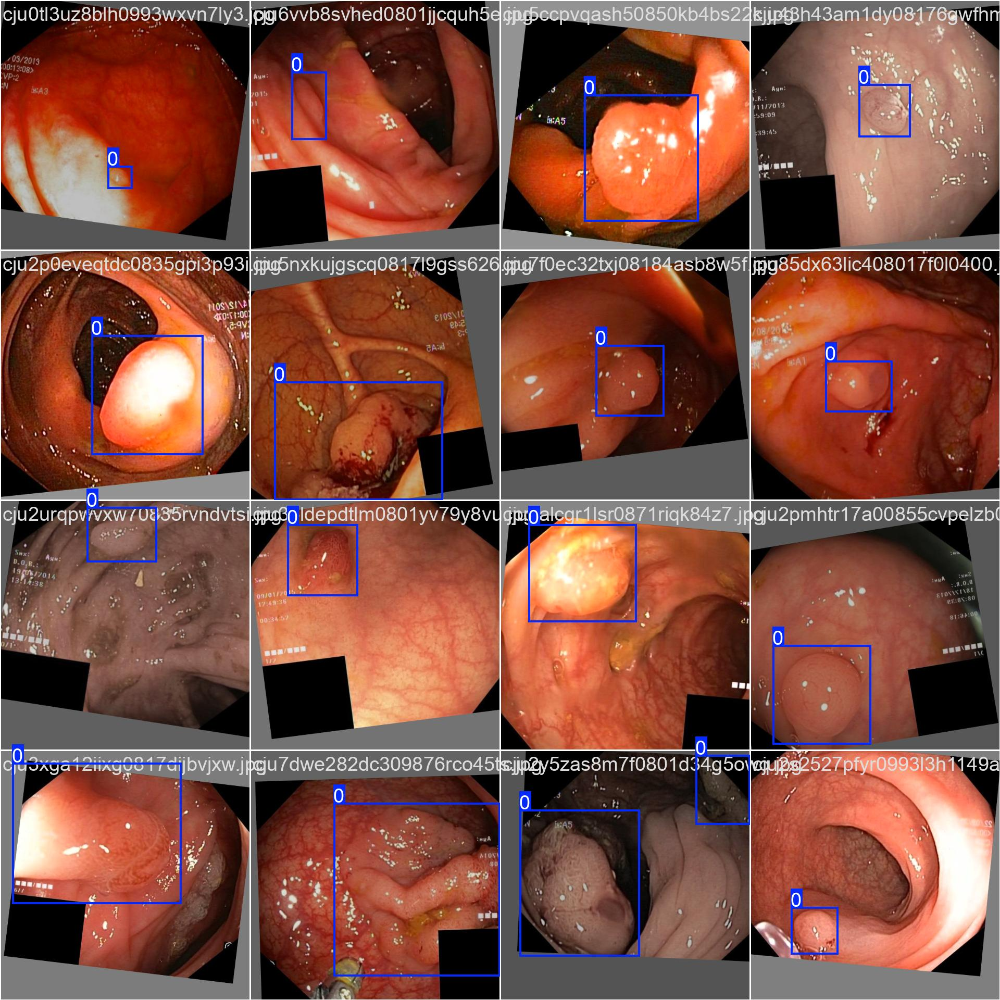

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/train_batch9500.jpg'))

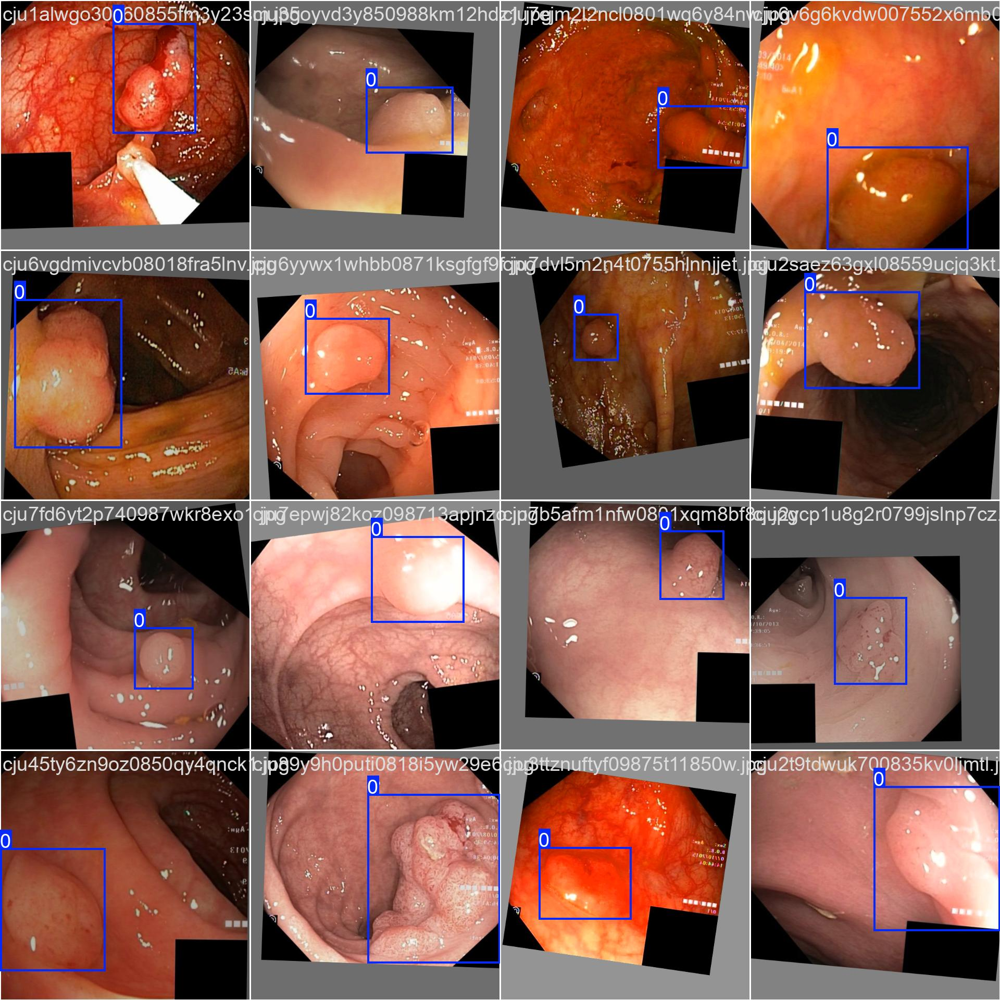

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/train_batch9501.jpg'))

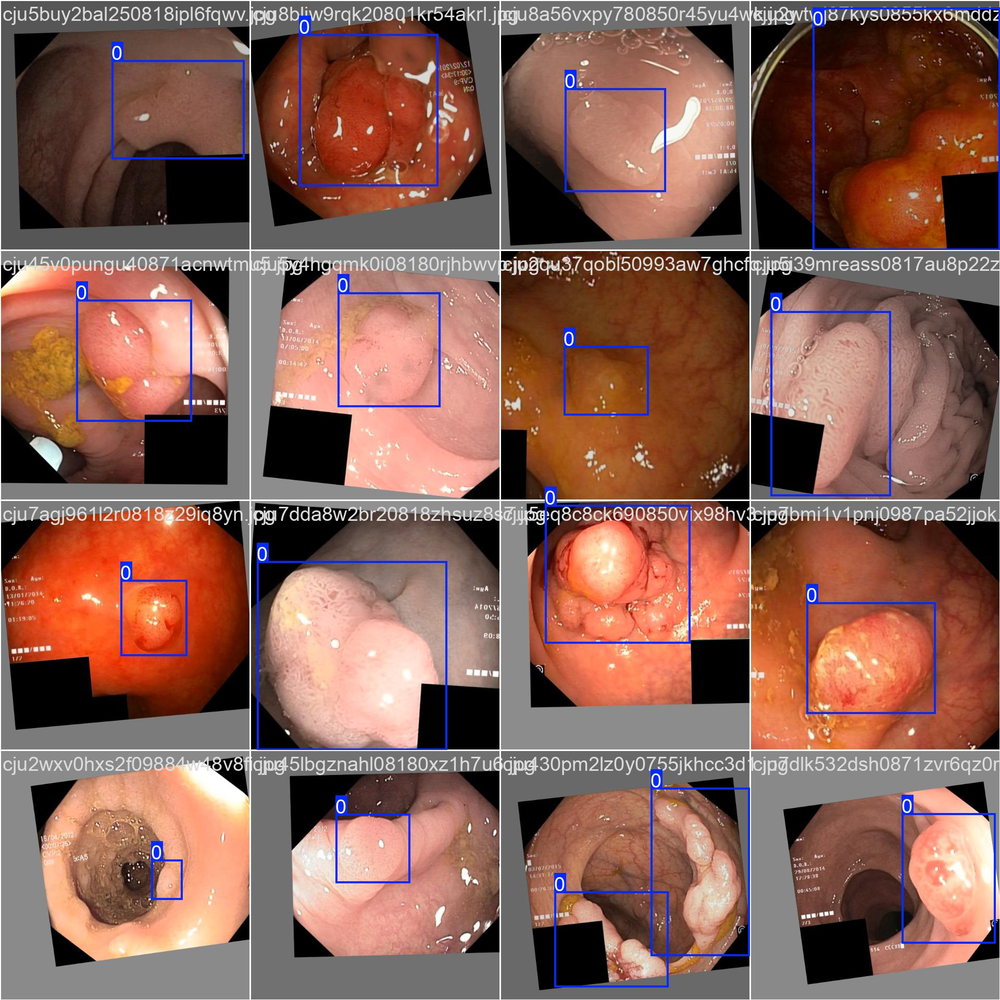

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/train_batch9502.jpg'))

### 8.4 Results and Performance Curves

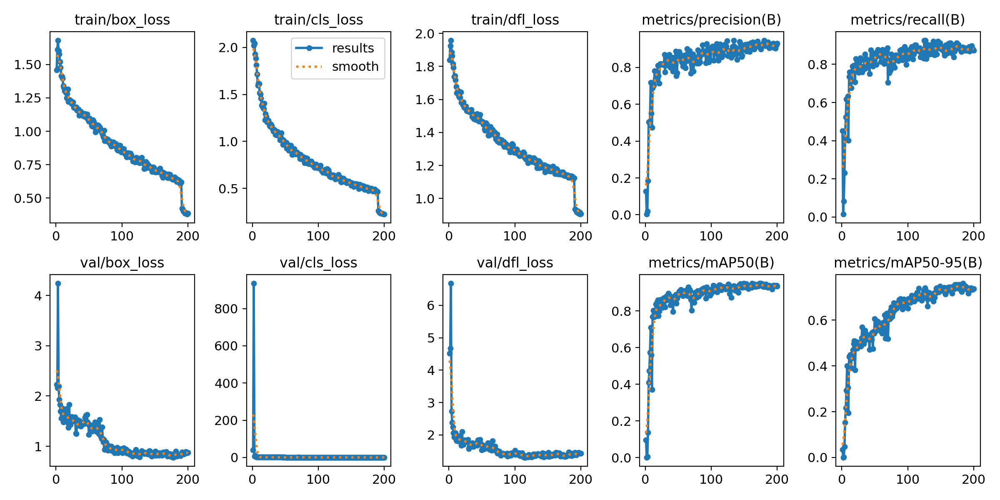

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/results.png'))

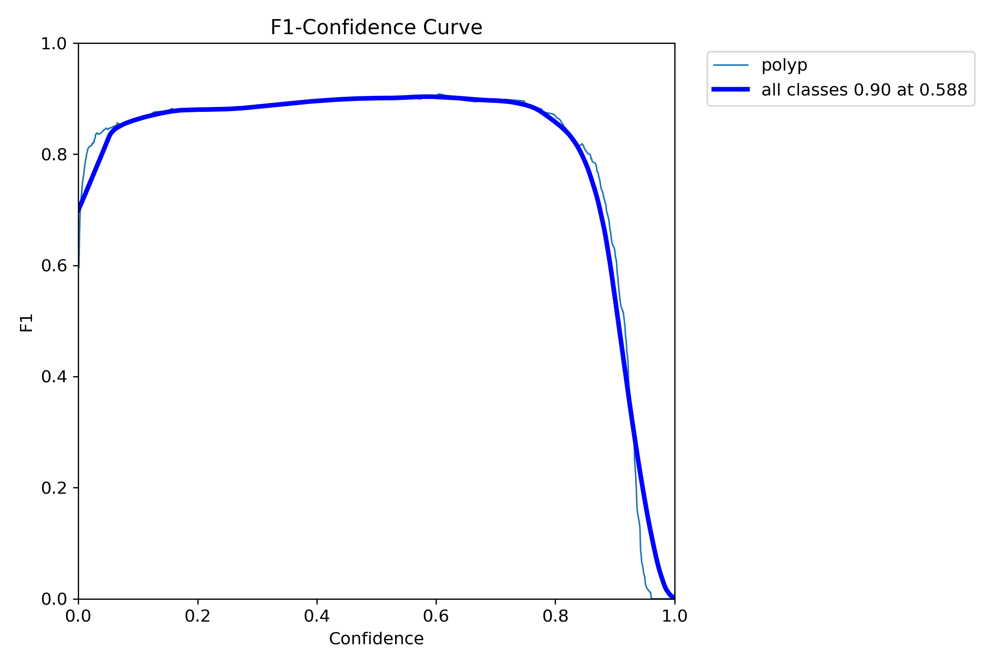

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/BoxF1_curve.png'))

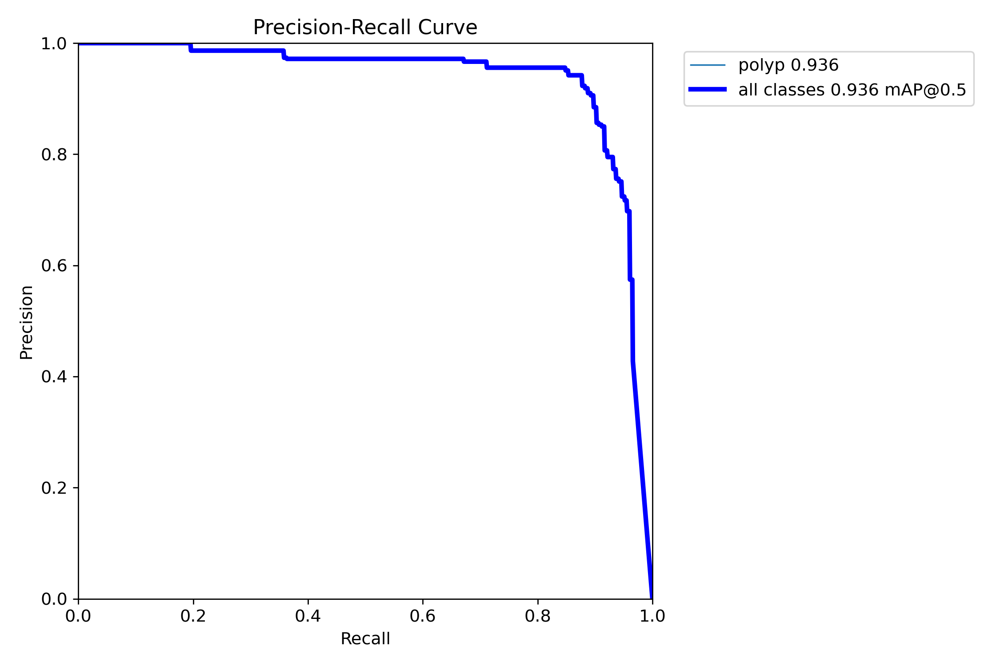

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/BoxPR_curve.png'))

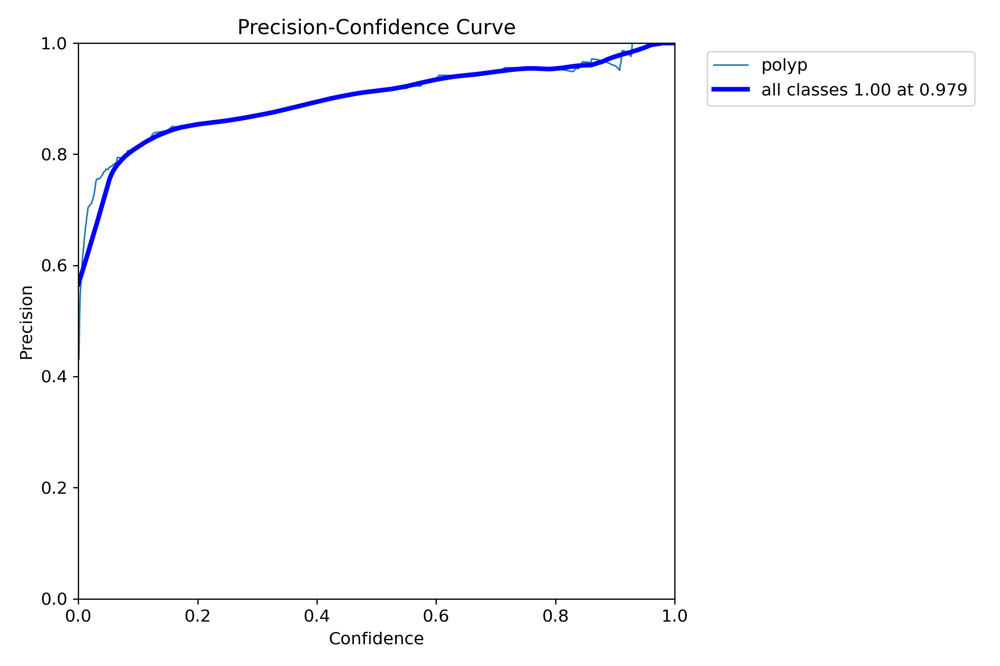

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/BoxP_curve.png'))

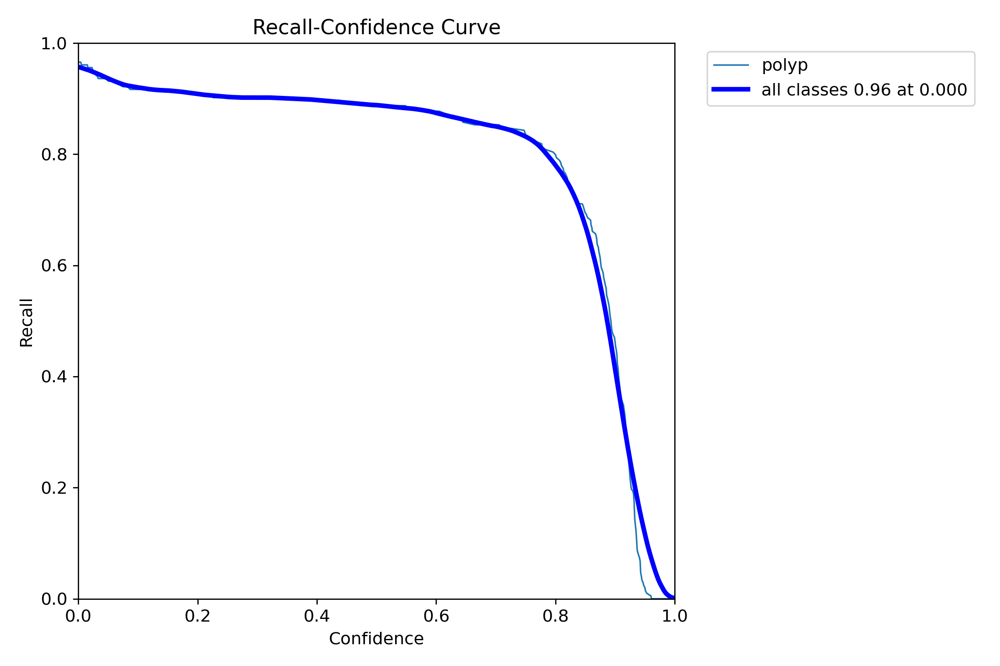

In [ ]:
display(Image(filename='//kaggle/working/runs/detect/train2/BoxR_curve.png'))

## 9. Inference on CVC-ClinicalDB Dataset

### 9.1 Download and Subset Test Dataset

In [ ]:
test_dataset_path = kagglehub.dataset_download('balraj98/cvcclinicdb')
test_dataset_path = Path(test_dataset_path)

full_folder = test_dataset_path / "PNG" /"Original"
subset_folder = Path("/kaggle/working/test_subset")
subset_folder.mkdir(exist_ok=True)

In [ ]:
N =64
image_paths = list(full_folder.glob("*.png"))[:N]

In [ ]:
for img_path in image_paths:
    shutil.copy(img_path, subset_folder)

### 9.2 Predict on Test Subset

In [ ]:
results = model.predict(
    source=str(subset_folder),
    save=True,
    name = 'clinicdb_test',
    exist_ok=True,
    imgsz=640
)


image 1/64 /kaggle/working/test_subset/104.png: 480x640 1 polyp, 28.0ms
image 2/64 /kaggle/working/test_subset/133.png: 480x640 1 polyp, 27.8ms
image 3/64 /kaggle/working/test_subset/142.png: 480x640 1 polyp, 27.8ms
image 4/64 /kaggle/working/test_subset/148.png: 480x640 1 polyp, 27.8ms
image 5/64 /kaggle/working/test_subset/153.png: 480x640 1 polyp, 27.9ms
image 6/64 /kaggle/working/test_subset/162.png: 480x640 1 polyp, 19.3ms
image 7/64 /kaggle/working/test_subset/167.png: 480x640 1 polyp, 17.5ms
image 8/64 /kaggle/working/test_subset/173.png: 480x640 1 polyp, 17.5ms
image 9/64 /kaggle/working/test_subset/177.png: 480x640 1 polyp, 17.6ms
image 10/64 /kaggle/working/test_subset/186.png: 480x640 1 polyp, 17.3ms
image 11/64 /kaggle/working/test_subset/204.png: 480x640 (no detections), 17.1ms
image 12/64 /kaggle/working/test_subset/222.png: 480x640 1 polyp, 17.1ms
image 13/64 /kaggle/working/test_subset/227.png: 480x640 1 polyp, 17.1ms
image 14/64 /kaggle/working/test_subset/231.png: 48

### 9.3 Display Prediction Results

In [ ]:
pred_path = "/kaggle/working/runs/detect/clinicdb_test"
image_files = [f for f in os.listdir(pred_path) if f.lower().endswith(('.jpg','.png'))]

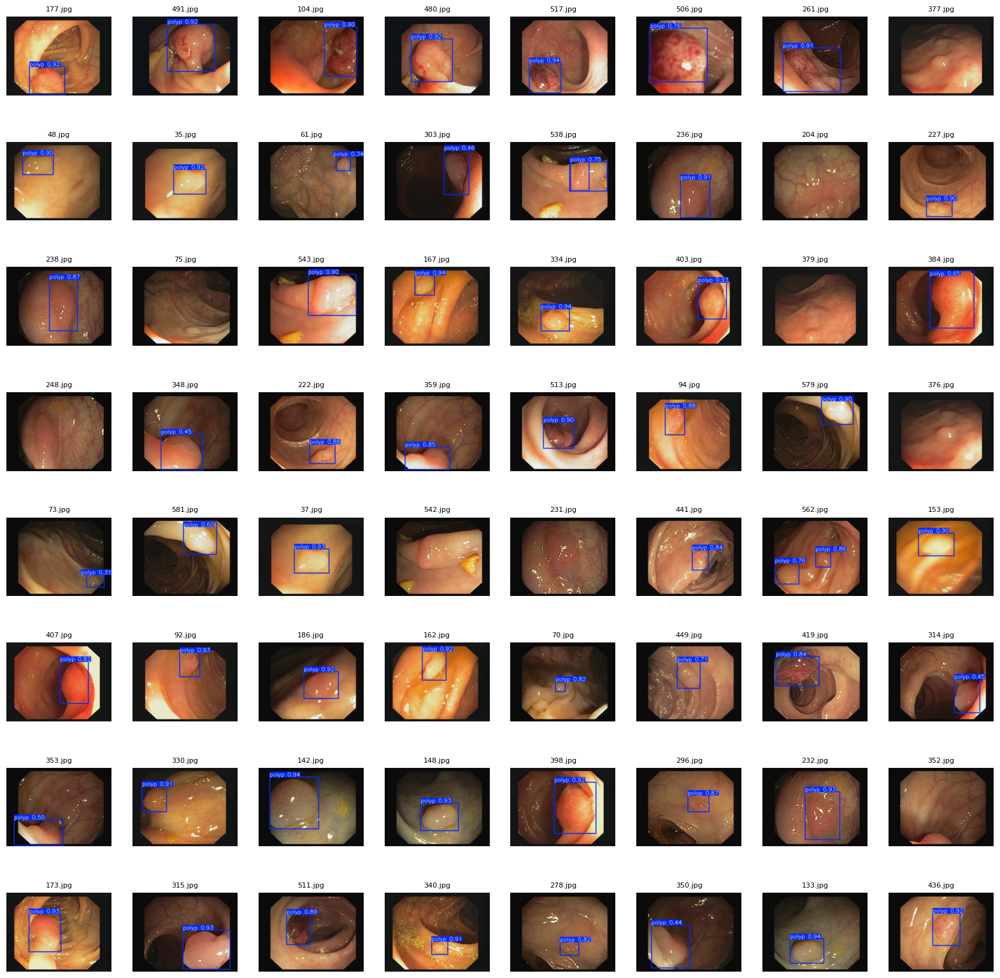

In [ ]:
fig, axes = plt.subplots(8,8, figsize=(20,20))

for i, ax in enumerate(axes.flat):
    img = imread(os.path.join(pred_path, image_files[i]))
    ax.imshow(img)
    ax.set_title(image_files[i], fontsize=8)
    ax.axis('off')
plt.show()